In [1]:
import sys
import os
from glob import glob
import pandas as pd
import spatialproteomics
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import tifffile
import scanpy as sc
import anndata as ad
import warnings
warnings.filterwarnings("ignore")

import gc
gc.collect() 

20

In [2]:
anndata=sc.read_h5ad('CODEX_run21-24_anndata_final_disease_allo_niche.h5ad')

In [3]:
anndata.obs['sample'].unique()

['run21_d180_1', 'run21_d0_2', 'run21_d0_3', 'run21_d60_4', 'run21_d180_5', ..., 'run24_d0_1', 'run24_d270_2', 'run24_d0_3', 'run24_d365_4', 'run24_d180_5']
Length: 17
Categories (17, object): ['run21_d0_2', 'run21_d0_3', 'run21_d60_4', 'run21_d180_1', ..., 'run24_d0_3', 'run24_d180_5', 'run24_d270_2', 'run24_d365_4']

In [4]:
anndata[anndata.obs['sample']=='run21_d180_1'].to_df().columns

Index(['X011.SMA', 'X013.Ki.67', 'X009.CD11b', 'X016.Nestin', 'X055.CD36',
       'X052.CD16', 'X006.Collagen.IV.human', 'X024.CD20', 'X079.S100B',
       'X026.CD68', 'X025.CD34.human', 'X074.PF4', 'X010.CD14', 'X127.CD61',
       'X072.Perilipin', 'X123.IDO1', 'X015.Vimentin', 'X132.Interferon.gamma',
       'X004.Gycophorin.A', 'X122.CD38', 'X051.CD146', 'X077.S100A4',
       'X019.Collagen.1', 'X126.S100A8.9', 'X084.CD56..NCam1.',
       'X006.HLA.DR.CD74', 'X103.CXCL12', 'X001.CD31'],
      dtype='object', name='x')

In [5]:
dat = { f.split('/')[-1].split('.')[0]: xr.open_zarr(f) for f in glob("./zarr/*.zarr") }

In [6]:
list(dat.keys())

['test_run24_2',
 'test_run21_2',
 'test_run22_1',
 'test_run23_1',
 'test_run24_5',
 'test_run22_2',
 'test_run23_3',
 'test_run23_2',
 'test_run23_4',
 'test_run21_5',
 'test_run21_1',
 'test_run21_4',
 'test_run22_3',
 'test_run24_1',
 'test_run24_4',
 'test_run24_3',
 'test_run21_3']

In [7]:
channels=list(dat['test_run24_2'].channels.to_dataframe().index)
channels

['DAPI',
 '050 CD138',
 '011 SMA',
 '013 Ki-67',
 '121 c-kit',
 '009 CD11b',
 '016 Nestin',
 '055 CD36',
 '052 CD16',
 '006 Collagen IV human',
 '024 CD20',
 '079 S100B',
 '026 CD68',
 '025 CD34 human',
 '074 PF4',
 '010 CD14',
 '007 CD4',
 '127 CD61',
 '150 VCAM-1',
 '023 CD11c',
 '072 Perilipin',
 '123 IDO1',
 '015 Vimentin',
 '132 Interferon gamma',
 '008 CD3e',
 '062 CXCL13',
 '004 Gycophorin A',
 '125 MCT',
 '122 CD38',
 '051 CD146',
 '077 S100A4',
 '019 Collagen 1',
 '128 Na/-K/ATPase',
 '126 S100A8 9',
 '084 CD56 (NCam1)',
 '071 Podoplanin',
 '006 HLA-DR CD74',
 '103 CXCL12',
 '124 TGFB1',
 '001 CD31',
 '129 SPP1',
 '151 ISG15',
 '152 MGP',
 '153 PDE5a']

In [8]:
dat['test_run24_2']

<xarray.Dataset> Size: 23GB
Dimensions:               (channels: 44, y: 8000, x: 28000, cells: 55126,
                           labels: 2, la_props: 2, features: 4)
Coordinates:
  * channels              (channels) <U21 4kB 'DAPI' '050 CD138' ... '153 PDE5a'
  * y                     (y) int64 64kB 0 1 2 3 4 ... 7995 7996 7997 7998 7999
  * x                     (x) int64 224kB 0 1 2 3 4 ... 27996 27997 27998 27999
  * cells                 (cells) int64 441kB 1 2 3 4 ... 55124 55125 55126
  * labels                (labels) int64 16B 1 2
  * la_props              (la_props) <U6 48B '_color' '_name'
  * features              (features) <U10 160B '_labels' 'area' ... 'centroid-1'
Data variables:
    _image                (channels, y, x) uint16 20GB dask.array<chunksize=(1, 8000, 28000), meta=np.ndarray>
    _intensity            (cells, channels) float64 19MB dask.array<chunksize=(6891, 11), meta=np.ndarray>
    _la_properties        (labels, la_props) object 32B dask.array<chunksize=(2, 2), meta=np.ndarray>
    _merged_segmentation  (y, x) int32 896MB dask.array<chunksize=(250, 1750), meta=np.ndarray>
    _obs                  (cells, features) float64 2MB dask.array<chunksize=(27563, 2), meta=np.ndarray>
    _seg1                 (y, x) int32 896MB dask.array<chunksize=(250, 1750), meta=np.ndarray>
    _seg2                 (y, x) int32 896MB dask.array<chunksize=(250, 1750), meta=np.ndarray>
    _segmentation         (y, x) int32 896MB dask.array<chunksize=(250, 1750), meta=np.ndarray>

In [9]:
dat['test_run24_2'].data_vars

Data variables:
    _image                (channels, y, x) uint16 20GB dask.array<chunksize=(1, 8000, 28000), meta=np.ndarray>
    _intensity            (cells, channels) float64 19MB dask.array<chunksize=(6891, 11), meta=np.ndarray>
    _la_properties        (labels, la_props) object 32B dask.array<chunksize=(2, 2), meta=np.ndarray>
    _merged_segmentation  (y, x) int32 896MB dask.array<chunksize=(250, 1750), meta=np.ndarray>
    _obs                  (cells, features) float64 2MB dask.array<chunksize=(27563, 2), meta=np.ndarray>
    _seg1                 (y, x) int32 896MB dask.array<chunksize=(250, 1750), meta=np.ndarray>
    _seg2                 (y, x) int32 896MB dask.array<chunksize=(250, 1750), meta=np.ndarray>
    _segmentation         (y, x) int32 896MB dask.array<chunksize=(250, 1750), meta=np.ndarray>

In [10]:
ids_from_seg2 = np.unique(dat['test_run24_2']._seg2.values)
ids_from_seg1 = np.unique(dat['test_run24_2']._seg1.values)

In [11]:
len(ids_from_seg2) ## MKs

676

In [12]:
len(ids_from_seg1) ## Other cells

57036

In [13]:
runs=['21', '22', '23', '24']
condition_vecs={'21':['d180', 'd0', 'd0', 'd60', 'd180'],
                   '22':['d365', 'd0', 'd60'],
                   '23':['d0', 'd365', 'd60', 'd100'],
                   '24':['d0', 'd270', 'd0', 'd365', 'd180']}

In [14]:
#int_prots.loc[anndata[anndata.obs['sample']==run+'_'+condition_vecs[run][i]+'_'+str(i+1)].to_df().index]=anndata[anndata.obs['sample']==run+'_'+condition_vecs[run][i]+'_'+str(i+1)].to_df()[['Osteopontin.166', 'X11.aSMA', 'X127.CD61', 'X103.CXCL12', 'Col1a.19']]

In [15]:
#int_prots.loc[anndata[anndata.obs['sample']==run+'_'+condition_vecs[run][i]+'_'+str(i+1)].to_df().index]

In [16]:
anndata.obs['sample']

0_run21_d180_1        run21_d180_1
1_run21_d180_1        run21_d180_1
2_run21_d180_1        run21_d180_1
3_run21_d180_1        run21_d180_1
6_run21_d180_1        run21_d180_1
                          ...     
36426_run24_d180_5    run24_d180_5
36428_run24_d180_5    run24_d180_5
36430_run24_d180_5    run24_d180_5
36432_run24_d180_5    run24_d180_5
36433_run24_d180_5    run24_d180_5
Name: sample, Length: 1167617, dtype: category
Categories (17, object): ['run21_d0_2', 'run21_d0_3', 'run21_d60_4', 'run21_d180_1', ..., 'run24_d0_3', 'run24_d180_5', 'run24_d270_2', 'run24_d365_4']

In [17]:
for run in runs:
    for i in range(len(condition_vecs[run])):
        
        idx=[str(n)+'_run'+run+'_'+condition_vecs[run][i]+'_'+str(i+1) for n in pd.DataFrame(dat['test_run'+run+'_'+str(i+1)]._obs).index]
        #int_prots=pd.DataFrame(dat['test_run'+run+'_'+str(i+1)]._intensity.data, columns=channels, index=idx)
        #int_prots=int_prots[['084 CD56 (NCam1)', '127 CD61', '009 CD11b', '004 Gycophorin A', '011 SMA']]
        int_prots=pd.DataFrame(0,index=idx, columns=['X084.CD56..NCam1.', 'X127.CD61', 'X009.CD11b', 'X004.Gycophorin.A', 'X011.SMA'])
        int_prots.loc[anndata[anndata.obs['sample']=='run'+run+'_'+condition_vecs[run][i]+'_'+str(i+1)].to_df().index]=anndata[anndata.obs['sample']=='run'+run+'_'+condition_vecs[run][i]+'_'+str(i+1)].to_df()[['X084.CD56..NCam1.', 'X127.CD61', 'X009.CD11b', 'X004.Gycophorin.A', 'X011.SMA']]
    
        dat['test_run'+run+'_'+str(i+1)] = dat['test_run'+run+'_'+str(i+1)].pp.add_obs_from_dataframe(int_prots)
    
        CTs=pd.DataFrame('Removed', index=idx, columns=['label'])
        CTs.loc[anndata[anndata.obs['sample']=='run'+run+'_'+condition_vecs[run][i]+'_'+str(i+1)].obs.index]=pd.DataFrame(anndata[anndata.obs['sample']=='run'+run+'_'+condition_vecs[run][i]+'_'+str(i+1)].obs['clusters_named'])
        CTs['cell']=pd.DataFrame(dat['test_run'+run+'_'+str(i+1)]._obs).index
        CTs['label']=CTs['label'].astype(str)

        dat['test_run'+run+'_'+str(i+1)] = dat['test_run'+run+'_'+str(i+1)].pp.drop_layers('_la_properties')
        dat['test_run'+run+'_'+str(i+1)] = dat['test_run'+run+'_'+str(i+1)].la.add_labels_from_dataframe(CTs)

Removing labels from observations. If you want to keep the labels in the obs layer, set drop_obs=False.
Removing labels from observations. If you want to keep the labels in the obs layer, set drop_obs=False.
Removing labels from observations. If you want to keep the labels in the obs layer, set drop_obs=False.
Removing labels from observations. If you want to keep the labels in the obs layer, set drop_obs=False.
Removing labels from observations. If you want to keep the labels in the obs layer, set drop_obs=False.
Removing labels from observations. If you want to keep the labels in the obs layer, set drop_obs=False.
Removing labels from observations. If you want to keep the labels in the obs layer, set drop_obs=False.
Removing labels from observations. If you want to keep the labels in the obs layer, set drop_obs=False.
Removing labels from observations. If you want to keep the labels in the obs layer, set drop_obs=False.
Removing labels from observations. If you want to keep the label

In [18]:
#int_prots
anndata[anndata.obs['sample']==run+'_'+condition_vecs[run][i]+'_'+str(i+1)].to_df()[['X084.CD56..NCam1.', 'X127.CD61', 'X009.CD11b', 'X004.Gycophorin.A', 'X011.SMA']]

x,X084.CD56..NCam1.,X127.CD61,X009.CD11b,X004.Gycophorin.A,X011.SMA


In [19]:
anndata.obs['sample']

0_run21_d180_1        run21_d180_1
1_run21_d180_1        run21_d180_1
2_run21_d180_1        run21_d180_1
3_run21_d180_1        run21_d180_1
6_run21_d180_1        run21_d180_1
                          ...     
36426_run24_d180_5    run24_d180_5
36428_run24_d180_5    run24_d180_5
36430_run24_d180_5    run24_d180_5
36432_run24_d180_5    run24_d180_5
36433_run24_d180_5    run24_d180_5
Name: sample, Length: 1167617, dtype: category
Categories (17, object): ['run21_d0_2', 'run21_d0_3', 'run21_d60_4', 'run21_d180_1', ..., 'run24_d0_3', 'run24_d180_5', 'run24_d270_2', 'run24_d365_4']

In [20]:
run+'_'+condition_vecs[run][i]+'_'+str(i+1)

'24_d180_5'

In [21]:
"""
#i=0
for i in range(0,3):
    
    idx=[str(n)+'_'+run+'_'+condition_vecs[run][i]+'_'+str(i+1) for n in pd.DataFrame(dat['test_Scan1_'+str(i+1)]._obs).index]
    #int_prots=pd.DataFrame(0,index=idx, columns=['Osteopontin', 'aSMA', 'CD61', 'CXCL12', 'Col1a19'])
    int_prots=pd.DataFrame(0,index=idx, columns=['Osteopontin.166', 'X11.aSMA', 'X127.CD61', 'X103.CXCL12', 'Col1a.19'])
    int_prots.loc[anndata[anndata.obs['sample']==run+'_'+condition_vecs[run][i]+'_'+str(i+1)].to_df().index]=anndata[anndata.obs['sample']==run+'_'+condition_vecs[run][i]+'_'+str(i+1)].to_df()[['Osteopontin.166', 'X11.aSMA', 'X127.CD61', 'X103.CXCL12', 'Col1a.19']]
    dat['test_Scan1_'+str(i+1)] = dat['test_Scan1_'+str(i+1)].pp.add_obs_from_dataframe(int_prots)

    CTs=pd.DataFrame('Removed', index=idx, columns=['label'])
    CTs.loc[anndata[anndata.obs['sample']==run+'_'+condition_vecs[run][i]+'_'+str(i+1)].obs.index]=pd.DataFrame(anndata[anndata.obs['sample']==run+'_'+condition_vecs[run][i]+'_'+str(i+1)].obs['clusters_named'])
    CTs['cell']=pd.DataFrame(dat['test_Scan1_'+str(i+1)]._obs).index
    CTs['cell']=CTs['cell'].astype(int)
    CTs['cell']=CTs['cell']+1
    CTs['label']=CTs['label'].astype(str)
    dat['test_Scan1_'+str(i+1)] = dat['test_Scan1_'+str(i+1)].la.add_labels_from_dataframe(CTs)
"""

"\n#i=0\nfor i in range(0,3):\n\n    idx=[str(n)+'_'+run+'_'+condition_vecs[run][i]+'_'+str(i+1) for n in pd.DataFrame(dat['test_Scan1_'+str(i+1)]._obs).index]\n    #int_prots=pd.DataFrame(0,index=idx, columns=['Osteopontin', 'aSMA', 'CD61', 'CXCL12', 'Col1a19'])\n    int_prots=pd.DataFrame(0,index=idx, columns=['Osteopontin.166', 'X11.aSMA', 'X127.CD61', 'X103.CXCL12', 'Col1a.19'])\n    int_prots.loc[anndata[anndata.obs['sample']==run+'_'+condition_vecs[run][i]+'_'+str(i+1)].to_df().index]=anndata[anndata.obs['sample']==run+'_'+condition_vecs[run][i]+'_'+str(i+1)].to_df()[['Osteopontin.166', 'X11.aSMA', 'X127.CD61', 'X103.CXCL12', 'Col1a.19']]\n    dat['test_Scan1_'+str(i+1)] = dat['test_Scan1_'+str(i+1)].pp.add_obs_from_dataframe(int_prots)\n\n    CTs=pd.DataFrame('Removed', index=idx, columns=['label'])\n    CTs.loc[anndata[anndata.obs['sample']==run+'_'+condition_vecs[run][i]+'_'+str(i+1)].obs.index]=pd.DataFrame(anndata[anndata.obs['sample']==run+'_'+condition_vecs[run][i]+'_'+str

In [22]:
cell_cols=pd.Series(anndata.uns['clusters_named_colors'])
cell_cols.index=anndata.obs.clusters_named.cat.categories

In [23]:
## colors
import seaborn as sns
#clist=sns.color_palette("tab10").as_hex()
#clist=list(anndata.uns['clusters_named_colors'])
#clist.append('lightgrey')
clist=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', 'lightgrey', '#e377c2']

In [24]:
'test_run24_3'

'test_run24_3'

In [25]:
#lab_props['label']

In [26]:
#cell_cols[lab_props['label'][[0,1,2,3,4,5,7]]]

In [27]:
# A clean way to update a specific label by name:
for run in runs:
    for i in range(len(condition_vecs[run])):
        lab_props=pd.DataFrame(dat['test_run'+run+'_'+str(i+1)]._la_properties, columns=['color', 'label'])
        for j in range(len(lab_props['label'])):
            label_to_change = lab_props['label'][j]
            new_color = clist[j] # Red
            
            # Find the row index where the second column matches your label
            mask = dat['test_run'+run+'_'+str(i+1)]._la_properties[:, 1] == label_to_change
            dat['test_run'+run+'_'+str(i+1)]._la_properties[mask, 0] = new_color
        
        label_to_change = "Removed"
        new_color = "lightgray" # Red
            
        # Find the row index where the second column matches your label
        mask = dat['test_run'+run+'_'+str(i+1)]._la_properties[:, 1] == label_to_change
        dat['test_run'+run+'_'+str(i+1)]._la_properties[mask, 0] = new_color

In [28]:
"""

# A clean way to update a specific label by name:
for smpl in range(0,3):
    lab_props=pd.DataFrame(dat['test_Scan1_'+str(smpl+1)]._la_properties, columns=['color', 'label'])
    for i in range(len(lab_props['label'])):
        label_to_change = lab_props['label'][i]
        new_color = clist[i] # Red
        
        # Find the row index where the second column matches your label
        mask = dat['test_Scan1_'+str(smpl+1)]._la_properties[:, 1] == label_to_change
        dat['test_Scan1_'+str(smpl+1)]._la_properties[mask, 0] = new_color
    
    label_to_change = "Removed"
    new_color = "lightgray" # Red
        
    # Find the row index where the second column matches your label
    mask = dat['test_Scan1_'+str(smpl+1)]._la_properties[:, 1] == label_to_change
    dat['test_Scan1_'+str(smpl+1)]._la_properties[mask, 0] = new_color

"""

'\n\n# A clean way to update a specific label by name:\nfor smpl in range(0,3):\n    lab_props=pd.DataFrame(dat[\'test_Scan1_\'+str(smpl+1)]._la_properties, columns=[\'color\', \'label\'])\n    for i in range(len(lab_props[\'label\'])):\n        label_to_change = lab_props[\'label\'][i]\n        new_color = clist[i] # Red\n\n        # Find the row index where the second column matches your label\n        mask = dat[\'test_Scan1_\'+str(smpl+1)]._la_properties[:, 1] == label_to_change\n        dat[\'test_Scan1_\'+str(smpl+1)]._la_properties[mask, 0] = new_color\n\n    label_to_change = "Removed"\n    new_color = "lightgray" # Red\n\n    # Find the row index where the second column matches your label\n    mask = dat[\'test_Scan1_\'+str(smpl+1)]._la_properties[:, 1] == label_to_change\n    dat[\'test_Scan1_\'+str(smpl+1)]._la_properties[mask, 0] = new_color\n\n'

In [29]:
pd.DataFrame(dat['test_run24_3']._obs, columns=pd.Series(dat['test_run24_3'].features))['X127.CD61'].value_counts()

X127.CD61
0.000000    114853
0.081790         9
0.023538         6
0.100477         5
0.043335         5
             ...  
0.315396         1
0.055691         1
0.315911         1
0.331192         1
0.137869         1
Name: count, Length: 101483, dtype: int64

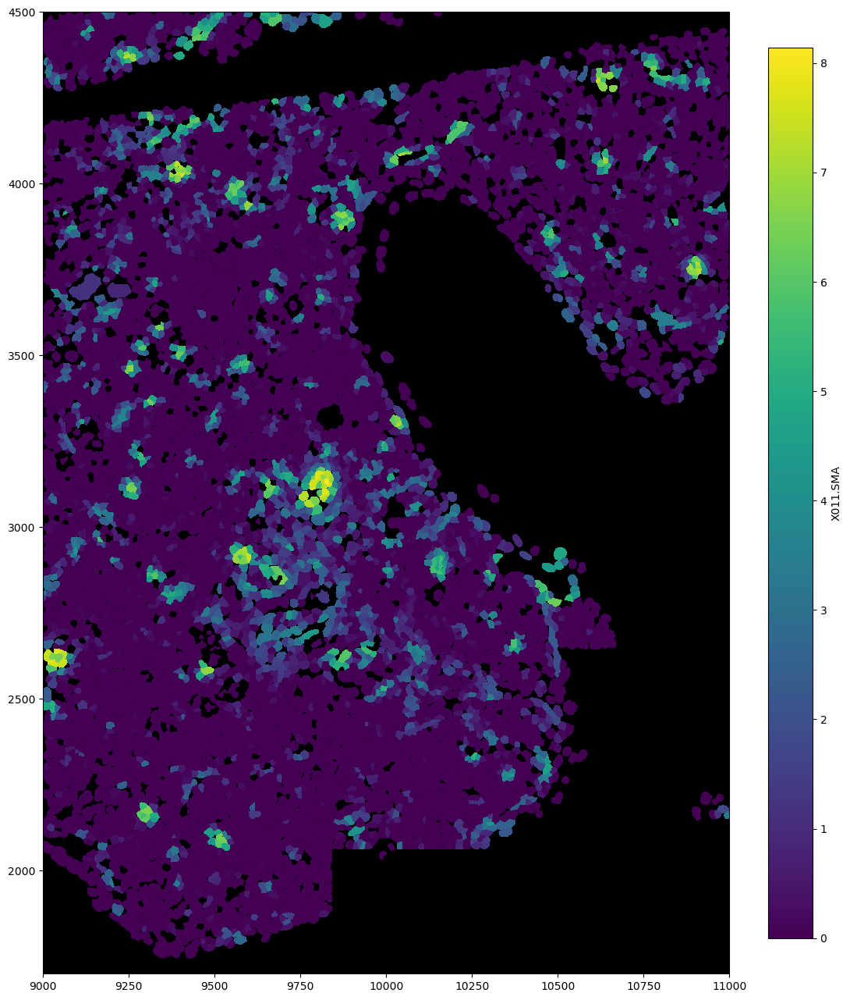

In [30]:
plt.figure(figsize=(16, 16))
_ = dat['test_run24_3'].la.deselect(["Removed"]).pp[9000:11000, 1700:4500].pl.render_obs("X011.SMA").pl.imshow(legend_obs=True, ax=plt.gca())
plt.savefig('./visual_output/test.png', dpi=900)

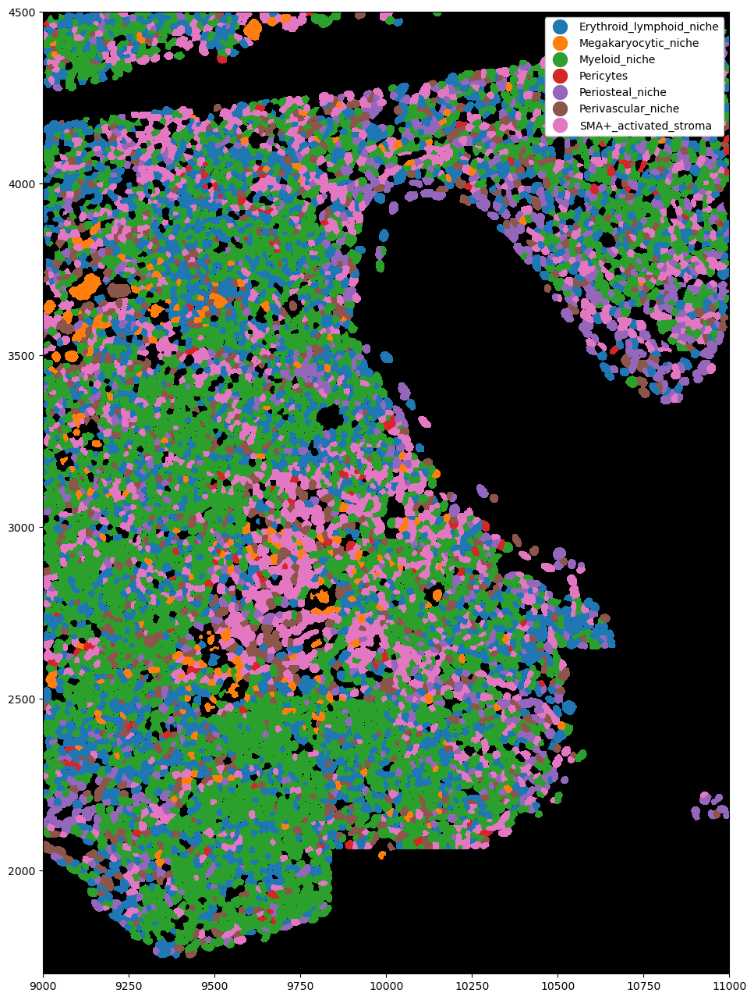

In [31]:
plt.figure(figsize=(16, 16))
_ = dat['test_run24_3'].la.deselect(["Removed"]).pp[9000:11000, 1700:4500].pl.show(render_image=False, render_labels=True, ax=plt.gca())
plt.savefig('./visual_output/clusters_test.png', dpi=900)

In [ ]:
#dat['test_run24_3'].la.deselect(["Removed"])

In [30]:
#plt.figure(figsize=(16, 16))
#_ = dat['test_Scan1_1'].pp[800:4500, 14000:18500].la["3", "5", "2", "7"].pl.show(render_image=False, render_labels=True, ax=plt.gca())
#plt.savefig('./visual_output/important_clusters_test_Scan1_1.png', dpi=900)

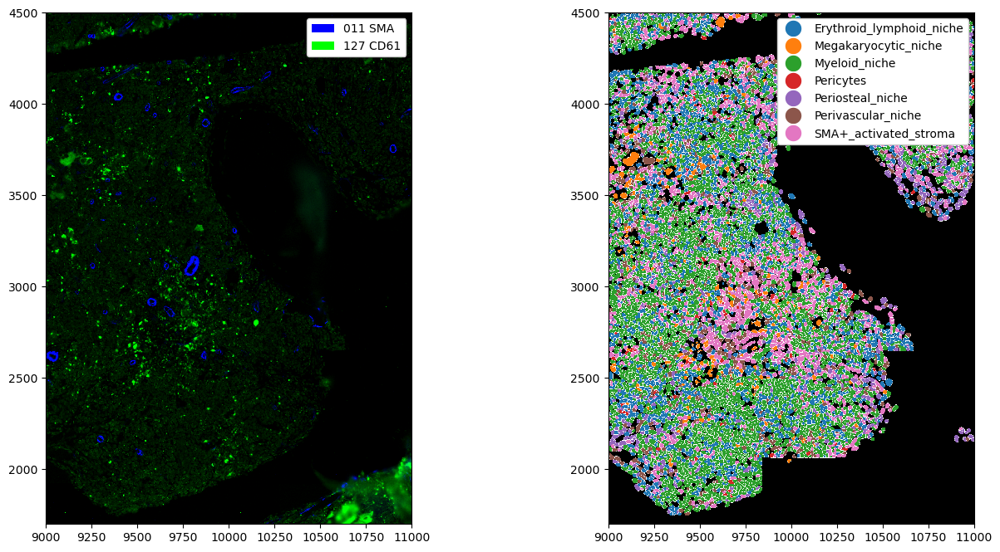

In [31]:
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
_ = dat['test_run24_3'].la.deselect(["Removed"]).pp[["011 SMA", "127 CD61"], 9000:11000, 1700:4500].pl.colorize(["#0000FF", "#00FF00"]).pl.show(ax=ax[0])


_ = (
    dat['test_run24_3'].la.deselect(["Removed"]).pp[9000:11000, 1700:4500]
    .pl.show(render_image=False, render_segmentation=True, render_labels=True, ax=ax[1])
)
# Access the legend of the current figure to move it
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
#plt.tight_layout()
#plt.show()

In [32]:
def filter_high(ds, q=0.99):
    # Calculate cutoff for each channel
    cutoff = ds.quantile(q, dim=["x", "y"])
    # Keep values below cutoff, otherwise set to 0
    return ds.where(ds <= cutoff, 0)

In [33]:
def filter_high_multi(ds, quantiles=[0.99, 0.95]):
    """
    Applies high-value filtering using a list of quantiles.
    quantiles: list of floats, one per channel in the image.
    """
    # Target the internal image variable
    img_var = '_image' if '_image' in ds.data_vars else 'image'
    
    # Loop through the channels by index
    for i, q in enumerate(quantiles):
        # 1. Get the channel by index (0, 1, 2...)
        channel_slice = ds[img_var].isel(channels=i)
        # 2. Calculate the specific cutoff for this channel
        cutoff = channel_slice.quantile(q).compute()
        # 3. Apply the filter directly to the dataset
        ds[img_var].loc[dict(channels=ds.channels.values[i])] = channel_slice.where(channel_slice <= cutoff, 0)
        
    return ds

In [34]:
list(dat['test_run24_3'].channels.to_dataframe().index)

['DAPI',
 '050 CD138',
 '011 SMA',
 '013 Ki-67',
 '121 c-kit',
 '009 CD11b',
 '016 Nestin',
 '055 CD36',
 '052 CD16',
 '006 Collagen IV human',
 '024 CD20',
 '079 S100B',
 '026 CD68',
 '025 CD34 human',
 '074 PF4',
 '010 CD14',
 '007 CD4',
 '127 CD61',
 '150 VCAM-1',
 '023 CD11c',
 '072 Perilipin',
 '123 IDO1',
 '015 Vimentin',
 '132 Interferon gamma',
 '008 CD3e',
 '062 CXCL13',
 '004 Gycophorin A',
 '125 MCT',
 '122 CD38',
 '051 CD146',
 '077 S100A4',
 '019 Collagen 1',
 '128 Na/-K/ATPase',
 '126 S100A8 9',
 '084 CD56 (NCam1)',
 '071 Podoplanin',
 '006 HLA-DR CD74',
 '103 CXCL12',
 '124 TGFB1',
 '001 CD31',
 '129 SPP1',
 '151 ISG15',
 '152 MGP',
 '153 PDE5a']

In [35]:
#def filter_bone(ds, filts=[1,2], cutoffs=[4,1000]):
def filter_bone(ds, filts=[0,1], cutoffs_q=[0.5,0.9]):
    """
    Bone filtering
    """
    # Target the internal image variable
    img_var = '_image' if '_image' in ds.data_vars else 'image'
    f1_slice=ds[img_var].isel(channels=filts[0])
    f2_slice=ds[img_var].isel(channels=filts[1])
    ## new
    f1_slice_cut=f1_slice.quantile(cutoffs_q[0]).compute()
    f2_slice_cut=f2_slice.quantile(cutoffs_q[1]).compute()
    ##
    # Loop through the channels by index
    for i, q in enumerate(list(ds.channels.to_dataframe().index)):
        # 1. Get the channel by index (0, 1, 2...)
        channel_slice = ds[img_var].isel(channels=i)
        # 3. Apply the filter directly to the dataset
        #ds[img_var].loc[dict(channels=ds.channels.values[i])] = channel_slice.where(f1_slice >= cutoffs[0], 0)
        #ds[img_var].loc[dict(channels=ds.channels.values[i])] = channel_slice.where(f2_slice <= cutoffs[1], 0)
        ds[img_var].loc[dict(channels=ds.channels.values[i])] = channel_slice.where(f1_slice >= f1_slice_cut, 0)
        ds[img_var].loc[dict(channels=ds.channels.values[i])] = channel_slice.where(f2_slice <= f2_slice_cut, 0)
        
    return ds

In [36]:
#dat['test_Scan1_3'].pp[["Osteopontin 166"], 1500:7000, 800:5000]['_obs'].to_pandas()._labels

In [30]:
ds=dat['test_run24_3'].la.deselect(["Removed"]).pp[['011 SMA', '127 CD61', '084 CD56 (NCam1)', '004 Gycophorin A', '009 CD11b'], 9250:10250, 2300:3300]

In [53]:
ds['_image'].isel(channels=0).quantile(0.5).compute()

<xarray.DataArray '_image' ()> Size: 8B
array(0.)
Coordinates:
    quantile  float64 8B 0.5

In [54]:
ds['_image'].isel(channels=1).quantile(0.7).compute()

<xarray.DataArray '_image' ()> Size: 8B
array(231.)
Coordinates:
    quantile  float64 8B 0.7

In [55]:
#ds=ds.pipe(filter_bone, cutoffs_q=[0.5,0.7])

In [56]:
#ds.to_zarr('test.zarr')

In [57]:
cols1=['#0072B2', '#00FF2B', '#FFD700']
cols2=['#CC79A7', '#00FFFF']

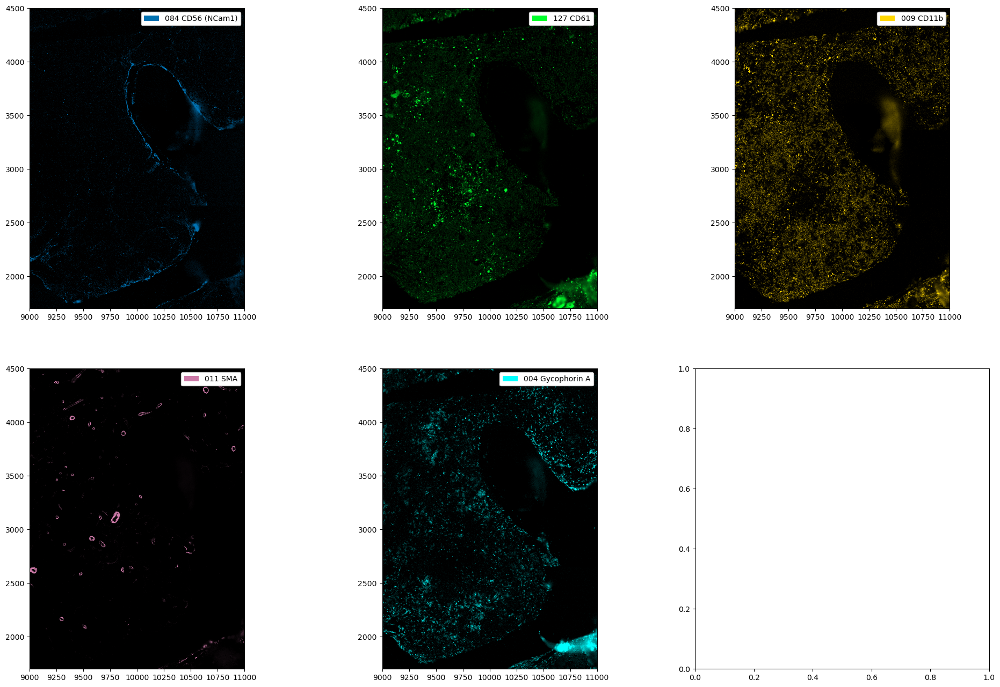

In [58]:
### Raw
fig, ax = plt.subplots(2, 3, figsize=(24, 16))
plt.close(fig)

for idu,mkr in enumerate(['084 CD56 (NCam1)', '127 CD61', '009 CD11b']):
    _ = (dat['test_run24_3'].pp[[mkr], 9000:11000, 1700:4500]
                   .pl.colorize([cols1[idu]])
                   .pl.show(ax=ax[0][idu]))
for idu,mkr in enumerate(['011 SMA', '004 Gycophorin A']):
    _ = (dat['test_run24_3'].pp[[mkr], 9000:11000, 1700:4500]
                   .pl.colorize([cols2[idu]])
                   .pl.show(ax=ax[1][idu]))

fig

#_ = (dat['test_Scan1_3'].pp[["Col1a 19"], 1500:7000, 800:5000]
#                   .pl.colorize(["#13F4EF"])
#                   .pl.show(ax=ax[2]))

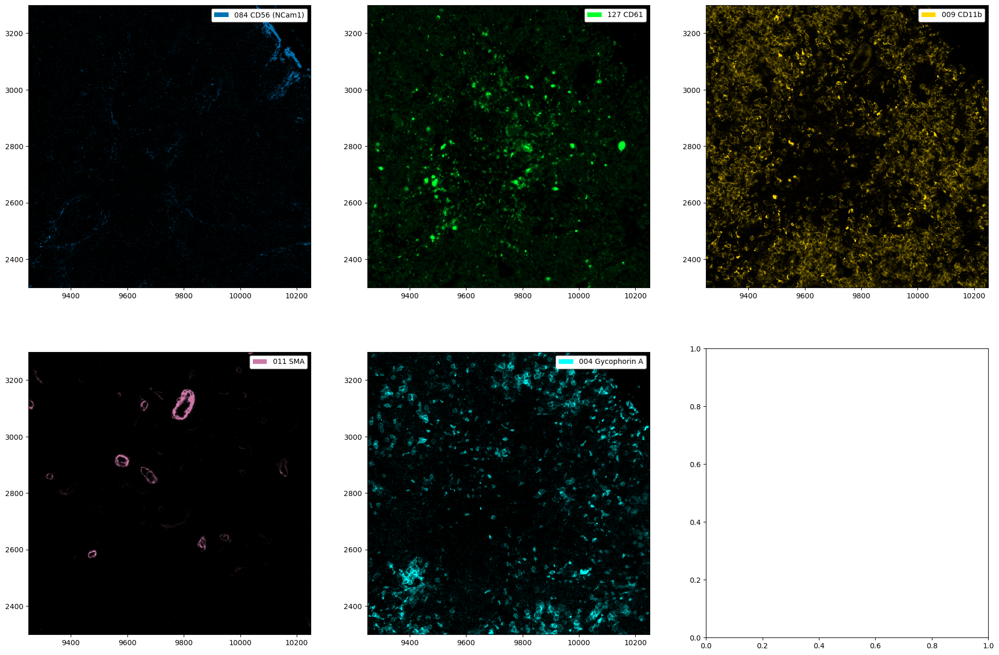

In [59]:
### Bone filter
fig, ax = plt.subplots(2, 3, figsize=(24, 16))
plt.close(fig)

for idu,mkr in enumerate(['084 CD56 (NCam1)', '127 CD61', '009 CD11b']):
    _ = (ds.pp[[mkr]]
         .pl.colorize([cols1[idu]])
         .pl.show(ax=ax[0][idu]))
for idu,mkr in enumerate(['011 SMA', '004 Gycophorin A']):
    _ = (ds.pp[[mkr]]
         .pl.colorize([cols2[idu]])
         .pl.show(ax=ax[1][idu]))

fig

#fig, ax = plt.subplots(1, 3, figsize=(24, 8))
#_ = (ds.pp[["Osteopontin 166"]].pl.colorize(["#39FF14"])
 #                  .pl.show(ax=ax[0]))
#_ = (ds.pp[["127 CD61"]].pl.colorize(["#FF005C"])
 #                  .pl.show(ax=ax[1]))
#_ = (ds.pp[["11 aSMA"]].pl.colorize(["#13F4EF"])
 #                  .pl.show(ax=ax[2]))
#_ = (ds.pp[["Col1a 19"]].pl.colorize(["#13F4EF"])
#                   .pl.show(ax=ax[2]))

In [60]:
filt_high1=[0.99, 0.99, 0.99]
filt_high2=[1, 0.99]
thr1=[0.9, 0.9, 0.9]
thr2=[0.9, 0.9]

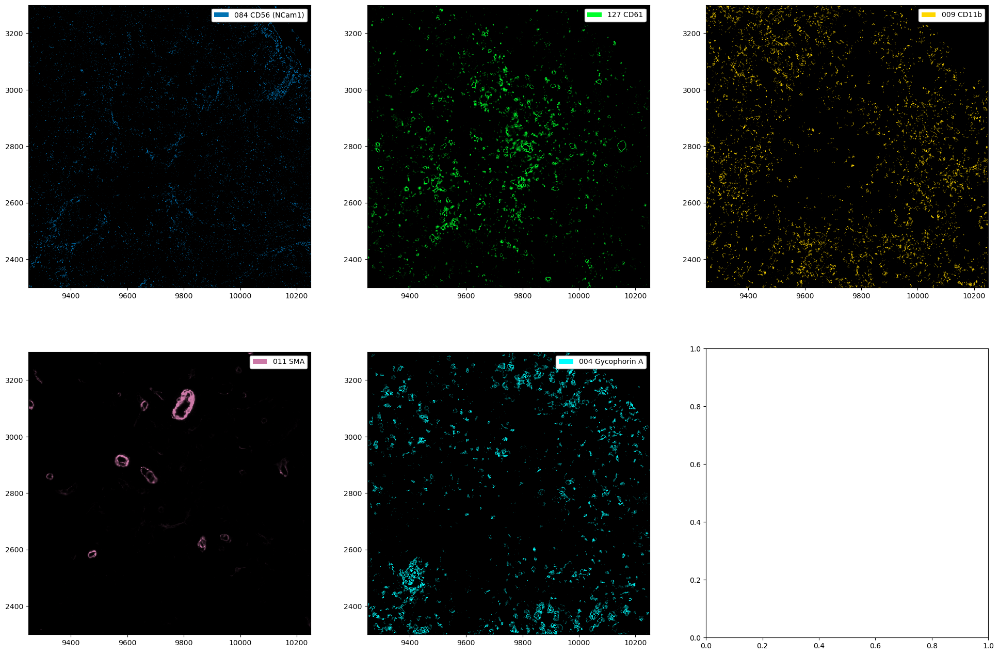

In [61]:
### Filtered

fig, ax = plt.subplots(2, 3, figsize=(24, 16))
plt.close(fig)

for idu,mkr in enumerate(['084 CD56 (NCam1)', '127 CD61', '009 CD11b']):
    _ = (ds.pp[[mkr]]
         .pipe(filter_high, q=filt_high1[idu]) 
         .pp.threshold(quantile=thr1[idu]) 
         .pl.colorize([cols1[idu]])
         .pl.show(ax=ax[0][idu]))
for idu,mkr in enumerate(['011 SMA', '004 Gycophorin A']):
    _ = (ds.pp[[mkr]]
         .pipe(filter_high, q=filt_high2[idu]) 
         .pp.threshold(quantile=thr2[idu]) 
         .pl.colorize([cols2[idu]])
         .pl.show(ax=ax[1][idu]))

fig

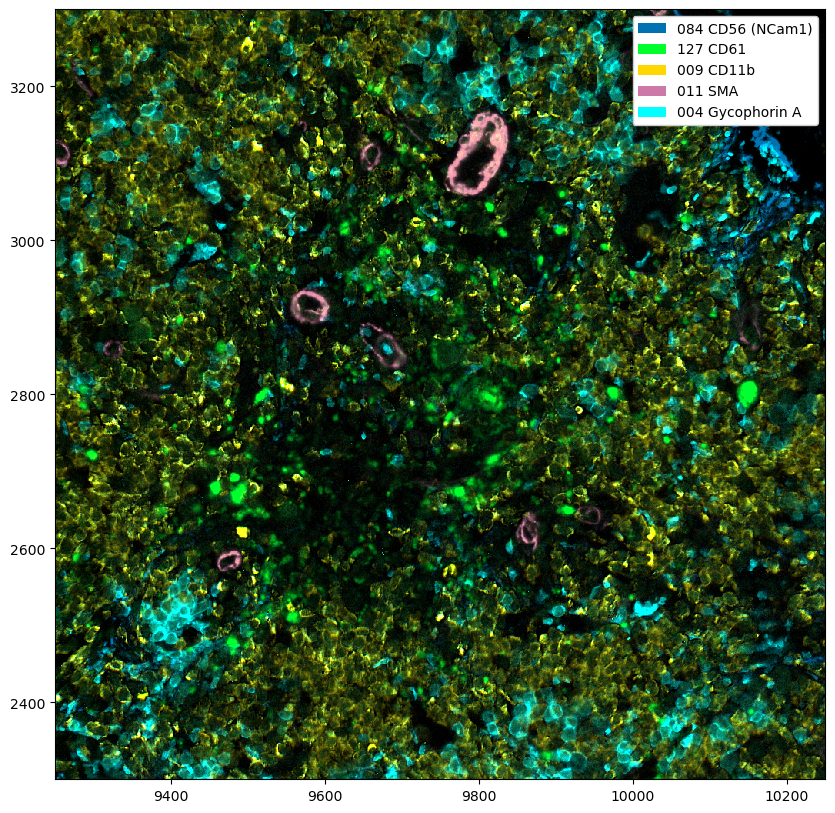

In [31]:
plt.figure(figsize=(10, 10))
_ = (ds.pp[['084 CD56 (NCam1)', '127 CD61', '009 CD11b', '011 SMA', '004 Gycophorin A']]
                   #.pipe(filter_high_multi, quantiles=[0.99, 0.99, 0.99, 1, 0.99])
                   #.pp.threshold(quantile=[0.9, 0.9, 0.9, 0.9, 0.9])
                   .pl.colorize(['#0072B2', '#00FF2B', '#FFD700', '#CC79A7', '#00FFFF'])
                   .pl.show())

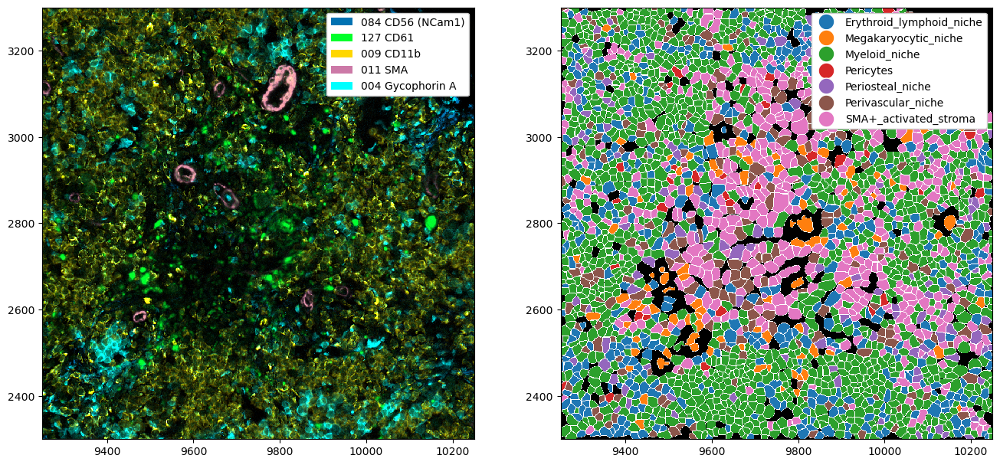

In [32]:
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
_ = (ds.pp[['084 CD56 (NCam1)', '127 CD61', '009 CD11b', '011 SMA', '004 Gycophorin A']]
                   #.pipe(filter_high_multi, quantiles=[0.99, 0.99, 0.99, 1, 0.99])
                   #.pp.threshold(quantile=[0.9, 0.9, 0.9, 0.9, 0.9])
                   .pl.colorize(['#0072B2', '#00FF2B', '#FFD700', '#CC79A7', '#00FFFF']).pl.show(ax=ax[0])
)
#_=ds_small.pl.colorize(["#d62728", "#8c564b"]).pl.show(ax=ax[0])
_ = (
    dat['test_run24_3'].la.deselect(["Removed"]).pp[9250:10250, 2300:3300]
    #.la["2", "3", "5"]
    #.la.set_label_colors(["2", "3", "5"], ["#0000FF", "#39FF14", "#FF005C"])
    .pl.show(render_image=False, render_segmentation=True, render_labels=True, ax=ax[1])
)

In [33]:
#fig.savefig('./visual_output/Clusts_mks_run24_3.png', dpi=1200)
fig.savefig('./visual_output/Clusts_mks_run24_3_noFilters.png', dpi=1200)

In [50]:
pd.DataFrame(dat['test_run24_3']._obs, columns=pd.Series(dat['test_run24_3'].features))['_labels'].value_counts()

_labels
3.0    71861
8.0    44618
1.0    33078
6.0    23699
5.0    20288
7.0    13889
2.0     8197
4.0     1958
Name: count, dtype: int64

In [51]:
pd.DataFrame(dat['test_run24_3']._obs, columns=pd.Series(dat['test_run24_3'].features))

,X004.Gycophorin.A,X009.CD11b,X011.SMA,X084.CD56..NCam1.,X127.CD61,_labels,area,centroid-0,centroid-1
0,0.000000,0.000000,0.000000,0.000000,2.113536,2.0,485.0,697.905155,4739.657732
1,0.000000,0.000000,0.331569,0.000000,2.240590,2.0,2748.0,701.552038,5040.140102
2,0.000000,0.000000,0.265197,0.000000,2.253184,2.0,1655.0,703.177039,4986.430816
3,0.000000,0.000000,0.912971,0.000000,2.563792,2.0,876.0,720.113014,4627.656393
4,0.000000,0.000000,0.482528,0.000000,2.315192,8.0,427.0,719.508197,4740.634660
...,...,...,...,...,...,...,...,...,...
217583,1.966050,0.000000,0.000000,1.218356,1.482975,6.0,272.0,14660.727941,14953.132353
217584,2.330551,0.003415,0.000000,1.144080,0.974759,2.0,451.0,14665.523282,14970.197339
217585,2.257713,0.024873,0.000000,1.029979,1.123043,2.0,344.0,14680.691860,14959.877907
217586,1.317574,0.000000,0.253760,0.062485,0.276391,2.0,292.0,14689.445205,14949.428082
